# 🎢 Level 8.5 — Momentum vs Adam Optimizer: 3D Loss Surface Descent Animation

> **Objective:**  
> To visualize how **Momentum** and **Adam** optimizers descend a 3D curved loss surface,  
> highlighting velocity accumulation, adaptive learning rates, and convergence behavior in space.


In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation
from mpl_toolkits.mplot3d import Axes3D
from IPython.display import HTML

# Define 3D loss surface
def f(x, y):
    """Loss surface: convex paraboloid with mild coupling."""
    return x**2 + 2*y**2 - 0.3*x*y

def grad(x, y):
    """Gradient of the loss surface."""
    dfdx = 2*x - 0.3*y
    dfdy = 4*y - 0.3*x
    return np.array([dfdx, dfdy])


In [2]:
# Gradient Descent
def gradient_descent(start, lr=0.05, steps=60):
    x, y = start
    path = [(x, y)]
    for _ in range(steps):
        g = grad(x, y)
        x -= lr * g[0]
        y -= lr * g[1]
        path.append((x, y))
    return np.array(path)

# Momentum
def momentum(start, lr=0.05, beta=0.9, steps=60):
    x, y = start
    v = np.zeros(2)
    path = [(x, y)]
    for _ in range(steps):
        g = grad(x, y)
        v = beta * v + lr * g
        x -= v[0]
        y -= v[1]
        path.append((x, y))
    return np.array(path)

# Adam
def adam(start, lr=0.08, beta1=0.9, beta2=0.999, eps=1e-8, steps=60):
    x, y = start
    m = np.zeros(2)
    v = np.zeros(2)
    path = [(x, y)]
    for t in range(1, steps + 1):
        g = grad(x, y)
        m = beta1 * m + (1 - beta1) * g
        v = beta2 * v + (1 - beta2) * (g ** 2)
        m_hat = m / (1 - beta1 ** t)
        v_hat = v / (1 - beta2 ** t)
        x -= lr * m_hat[0] / (np.sqrt(v_hat[0]) + eps)
        y -= lr * m_hat[1] / (np.sqrt(v_hat[1]) + eps)
        path.append((x, y))
    return np.array(path)


In [3]:
start = np.array([2.8, 2.8])
steps = 60

gd_path = gradient_descent(start, steps=steps)
mom_path = momentum(start, steps=steps)
adam_path = adam(start, steps=steps)

paths = {"Gradient Descent": gd_path, "Momentum": mom_path, "Adam": adam_path}


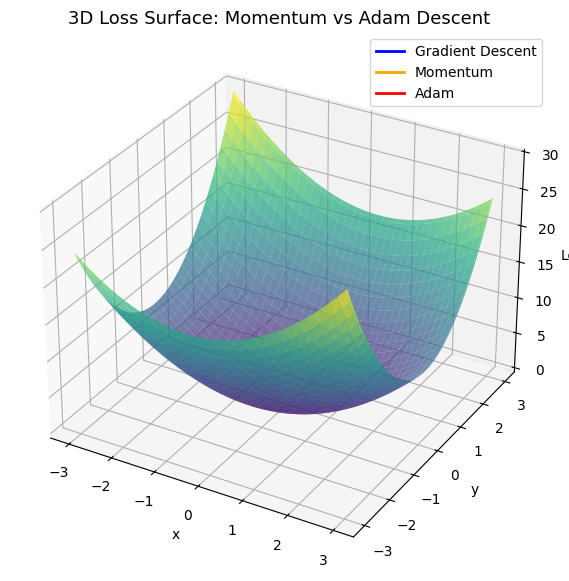

In [4]:
fig = plt.figure(figsize=(9, 7))
ax = fig.add_subplot(111, projection='3d')

# Surface grid
X = np.linspace(-3, 3, 150)
Y = np.linspace(-3, 3, 150)
X, Y = np.meshgrid(X, Y)
Z = f(X, Y)

ax.plot_surface(X, Y, Z, cmap="viridis", alpha=0.7, rstride=4, cstride=4, linewidth=0.5)
ax.set_title("3D Loss Surface: Momentum vs Adam Descent", fontsize=13)
ax.set_xlabel("x")
ax.set_ylabel("y")
ax.set_zlabel("Loss")

colors = {"Gradient Descent": "blue", "Momentum": "orange", "Adam": "red"}
lines, points = {}, {}

for name in paths:
    lines[name], = ax.plot([], [], [], lw=2, color=colors[name], label=name)
    points[name], = ax.plot([], [], [], "o", color=colors[name])

ax.legend()


In [5]:
def init():
    for name in paths:
        lines[name].set_data([], [])
        lines[name].set_3d_properties([])
        points[name].set_data([], [])
        points[name].set_3d_properties([])
    return list(lines.values()) + list(points.values())

def update(frame):
    for name, path in paths.items():
        if frame >= len(path):
            continue
        x, y = path[:frame, 0], path[:frame, 1]
        z = f(x, y)
        lines[name].set_data(x, y)
        lines[name].set_3d_properties(z)
        points[name].set_data(x[-1:], y[-1:])
        points[name].set_3d_properties(z[-1:])
    return list(lines.values()) + list(points.values())

ani = animation.FuncAnimation(fig, update, init_func=init,
                              frames=steps, interval=150, blit=False)

from IPython.display import HTML
import matplotlib
plt.close(fig)
matplotlib.rcParams["animation.html"] = "jshtml"
display(HTML(ani.to_jshtml()))


## 🧠 Mathematical Insight

### Gradient Descent
- Updates parameters directly along the negative gradient:
  $$
  \theta_{t+1} = \theta_t - \eta \nabla f(\theta_t)
  $$
- Converges slowly and oscillates along steep valleys.

### Momentum
- Adds inertia:
  $$
  v_t = \beta v_{t-1} + (1 - \beta) \nabla f(\theta_t)
  $$
  $$
  \theta_{t+1} = \theta_t - \eta v_t
  $$
- Builds velocity in the correct direction — fewer oscillations, faster descent.

### Adam
- Combines momentum and adaptive learning rates:
  $$
  m_t = \beta_1 m_{t-1} + (1 - \beta_1)\nabla f_t,\quad
  v_t = \beta_2 v_{t-1} + (1 - \beta_2)\nabla f_t^2
  $$
  $$
  \theta_{t+1} = \theta_t - \eta \frac{m_t / (1 - \beta_1^t)}{\sqrt{v_t / (1 - \beta_2^t)} + \epsilon}
  $$

- Adam dynamically rescales step sizes per parameter — stable, fast convergence.


## 🧩 Key Observations

| Optimizer | Descent Behavior | Convergence | Comment |
|------------|------------------|--------------|----------|
| **Gradient Descent** | Straight, stiff path | Slow | Sensitive to learning rate |
| **Momentum** | Smooth, curved motion | Faster | Builds velocity, reduces oscillation |
| **Adam** | Adaptive path hugging curvature | Fastest | Combines speed and stability |


## 🚀 Takeaway

- **Momentum** accelerates optimization using accumulated gradients.  
- **Adam** improves further by adapting learning rates per parameter dimension.  
- Both methods outperform pure Gradient Descent in efficiency and stability.

These optimizers form the foundation of **modern deep learning training dynamics**.


In [6]:
ani.save("momentum_vs_adam_3D.gif", writer="pillow", fps=8)
